In [1]:
import pandas as pd
file_path= 'C:/Users/harsha/Desktop/DataMining_733/Project/suggestions.csv'
df=pd.read_csv('C:/Users/harsha/Desktop/DataMining_733/Project/suggestions.csv')
df.head()


FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/harsha/Desktop/DataMining_733/Project/suggestions.csv'

In [2]:
num_rows, num_cols = df.shape
print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_cols}")

Number of rows: 16429
Number of columns: 10


In [3]:
missing_count = df.isnull().sum()

# Calculate the total count of missing values
total_missing = missing_count.sum()

# Calculate the percentage of missing values
total_rows = len(df)
percent_missing = (total_missing / (total_rows * len(df.columns))) * 100
print("Count of Missing Values:")
print(missing_count)
print("\nTotal Missing Values:", total_missing)
print("Percentage of Missing Values: {:.2f}%".format(percent_missing))

Count of Missing Values:
Recommended                                                  0
Suggestion_Id                                                0
Responses                                                    0
Views                                                        0
Votes_Up                                                     0
Votes_Down                                                   0
Author_Id                                                    0
Author_Join (in terms of how many days since they joined)    0
Author_TotalPosts                                            0
Author_PostsPerDay                                           0
dtype: int64

Total Missing Values: 0
Percentage of Missing Values: 0.00%


In [4]:
column_info = []

# Iterate through each column
for column in df.columns:
    column_data = {
        'Column Name': column,
        'Data Type': str(df[column].dtype)
    }

    # Check if it's a numeric attribute
    if pd.api.types.is_numeric_dtype(df[column]):
        column_data['Attribute Type'] = 'Numeric'

        # Calculate statistics
        column_data['Min'] = df[column].min()
        column_data['Max'] = df[column].max()
        column_data['Mean'] = df[column].mean()
        column_data['Median'] = df[column].median()
        column_data['Standard Deviation'] = df[column].std()
    
        # For numeric attributes, no top 3 values are applicable
        column_data['Top 3 Values'] = None
    
    # Check if it's a discrete attribute
    elif pd.api.types.is_categorical_dtype(df[column]) or pd.api.types.is_string_dtype(df[column]):
        column_data['Attribute Type'] = 'Discrete'

        # Calculate unique values
        unique_values = df[column].nunique()
        column_data['Unique Values'] = unique_values

        # Handle top 3 values
        if unique_values <= 3:
            top_3_values = df[column].value_counts().to_dict()
        else:
            top_3_values = dict(df[column].value_counts().head(3))
        column_data['Top 3 Values'] = top_3_values
    
    # Check for missing values
    missing_percentage = df[column].isnull().mean() * 100
    column_data['Missingness (%)'] = missing_percentage

    # Append column information to the list
    column_info.append(column_data)

# Create a DataFrame from the list of column information
column_info_df = pd.DataFrame(column_info)

# Display the results
print(column_info_df)

                                         Column Name Data Type Attribute Type  \
0                                        Recommended     int64        Numeric   
1                                      Suggestion_Id     int64        Numeric   
2                                          Responses     int64        Numeric   
3                                              Views     int64        Numeric   
4                                           Votes_Up     int64        Numeric   
5                                         Votes_Down     int64        Numeric   
6                                          Author_Id     int64        Numeric   
7  Author_Join (in terms of how many days since t...     int64        Numeric   
8                                  Author_TotalPosts     int64        Numeric   
9                                 Author_PostsPerDay   float64        Numeric   

       Min        Max           Mean    Median  Standard Deviation  \
0      0.0        1.0       0.034208  

In [5]:
#!pip install --upgrade pandas_profiling numba

In [6]:
import pandas_profiling as pp
from pandas_profiling import ProfileReport

# Create a profile report
profile = ProfileReport(df)

# Generate an HTML report
profile.to_file("profiling_report_GP.html")

C:\Users\harsha\AppData\Local\Temp/ipykernel_19716/1215209360.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile.to_file("profiling_report_GP.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
duplicates = df[df.duplicated()]
total_duplicates = df.duplicated().sum()

# Display the total count of duplicates
print("Total Count of Duplicates:", total_duplicates)
duplicate_columns = df.columns[df.apply(lambda x: x.duplicated()).any()]

# Display the columns with duplicates
print("Columns with duplicate values:")
print(duplicate_columns)

Total Count of Duplicates: 3
Columns with duplicate values:
Index(['Recommended', 'Suggestion_Id', 'Responses', 'Views', 'Votes_Up',
       'Votes_Down', 'Author_Id',
       'Author_Join (in terms of how many days since they joined)',
       'Author_TotalPosts', 'Author_PostsPerDay'],
      dtype='object')


In [10]:
df =df[~df.duplicated()]
duplicates = df[df.duplicated()]
total_duplicates = df.duplicated().sum()

# Display the total count of duplicates
print("Total Count of Duplicates:", total_duplicates)

Total Count of Duplicates: 0


In [11]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Outliers in 'Responses':
       Recommended  Suggestion_Id  Responses  Views  Votes_Up  Votes_Down  \
0                0          35463         77   3849       242           7   
1                0          37480        428  28290      1149         201   
2                0          39814        160   7561       648          45   
3                0          41970         89   9937       197          14   
5                1          50219         62   1608       121          13   
...            ...            ...        ...    ...       ...         ...   
15769            0         287721         47   2092        26           4   
15874            0         289975         70   2799        20           4   
15889            0         290136         43   1102         6           2   
15892            0         290258         91   2135        11           4   
16199            0         296287         42   2101        23           0   

       Author_Id  Author_Join (in terms of how man

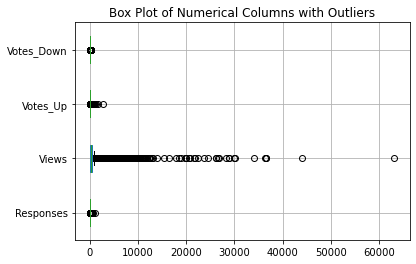

In [12]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
# Define the numerical columns you want to check for outliers
numerical_columns = ['Responses', 'Views', 'Votes_Up', 'Votes_Down']

# Function to detect and display outliers
def find_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Detect and display outliers for each numerical column
for column in numerical_columns:
    outliers = find_outliers(df, column)
    print(f"Outliers in '{column}':")
    print(outliers)

# Visualize outliers using box plots
df[numerical_columns].boxplot(whis=1.5, vert=False, patch_artist=True, widths=0.5)
plt.title('Box Plot of Numerical Columns with Outliers')
plt.show()


In [13]:
import pandas as pd

# Define the numerical columns you want to check for outliers
numerical_columns = ['Responses', 'Views', 'Votes_Up', 'Votes_Down']

# Function to remove outliers based on IQR
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter the data to remove outliers
    data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return data

# Create a copy of the original DataFrame
df_no_outliers = df.copy()

# Remove outliers for each numerical column
for column in numerical_columns:
    df_no_outliers = remove_outliers_iqr(df_no_outliers, column)

# Display the shape of the original and filtered DataFrame
print(f'Shape of the original DataFrame: {df.shape}')
print(f'Shape of the DataFrame without outliers: {df_no_outliers.shape}')

# df_no_outliers now contains the dataset with outliers removed


Shape of the original DataFrame: (16426, 10)
Shape of the DataFrame without outliers: (11442, 10)


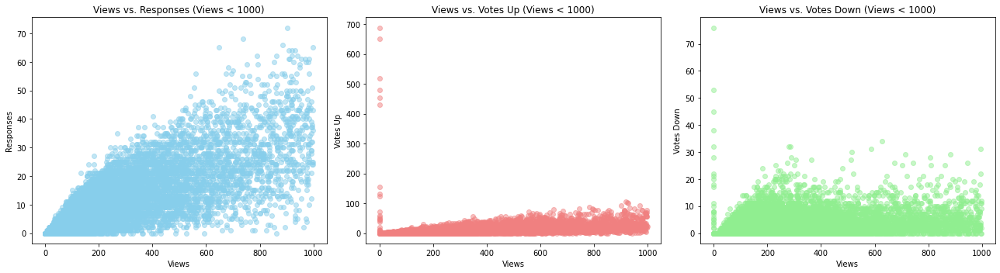

In [14]:
%matplotlib inline
import matplotlib.pyplot as plt

# Filter data where Views are less than a threshold (e.g., 1000)
threshold_views = 1000
filtered_data = df[df['Views'] < threshold_views]

# Create subplots to display scatter plots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Scatter plot for Views vs. Responses (filtered data)
axes[0].scatter(filtered_data['Views'], filtered_data['Responses'], color='skyblue', alpha=0.5)
axes[0].set_xlabel('Views')
axes[0].set_ylabel('Responses')
axes[0].set_title('Views vs. Responses (Views < 1000)')

# Scatter plot for Views vs. Votes_Up (filtered data)
axes[1].scatter(filtered_data['Views'], filtered_data['Votes_Up'], color='lightcoral', alpha=0.5)
axes[1].set_xlabel('Views')
axes[1].set_ylabel('Votes Up')
axes[1].set_title('Views vs. Votes Up (Views < 1000)')

# Scatter plot for Views vs. Votes_Down (filtered data)
axes[2].scatter(filtered_data['Views'], filtered_data['Votes_Down'], color='lightgreen', alpha=0.5)
axes[2].set_xlabel('Views')
axes[2].set_ylabel('Votes Down')
axes[2].set_title('Views vs. Votes Down (Views < 1000)')

plt.tight_layout()
plt.show()


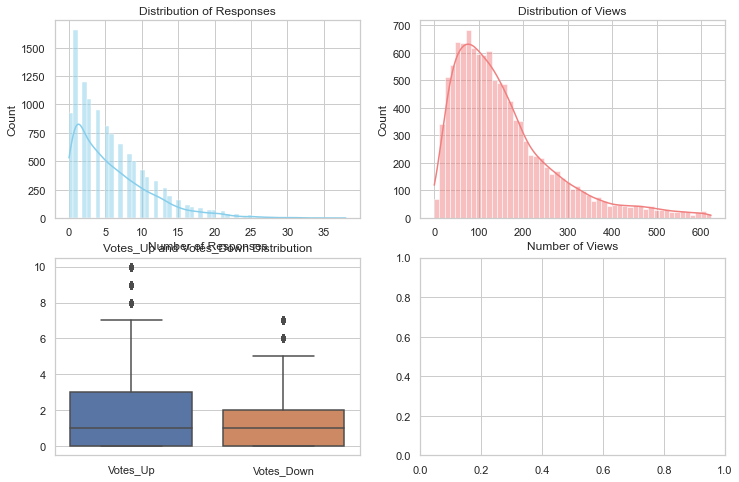

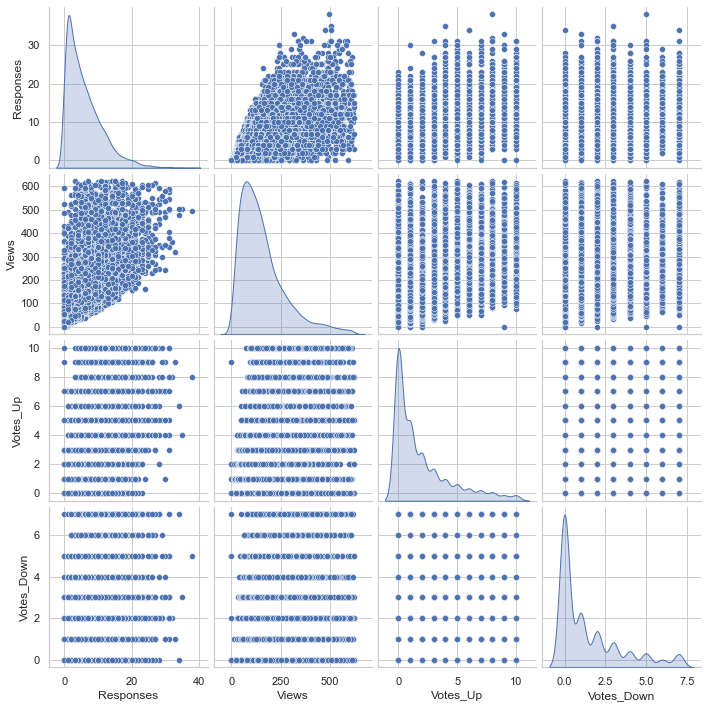

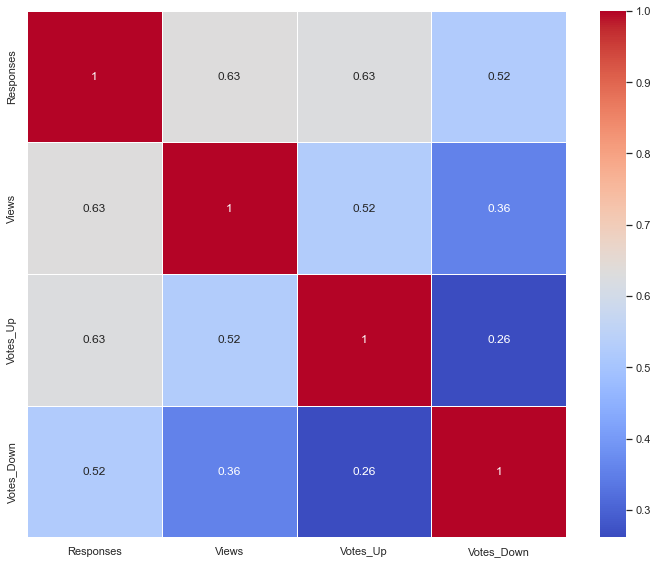

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for Seaborn
sns.set(style="whitegrid")

# Create subplots for visualization
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograms for cleaned dataset
sns.histplot(df_no_outliers['Responses'], kde=True, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Distribution of Responses')
axes[0, 0].set_xlabel('Number of Responses')

sns.histplot(df_no_outliers['Views'], kde=True, ax=axes[0, 1], color='lightcoral')
axes[0, 1].set_title('Distribution of Views')
axes[0, 1].set_xlabel('Number of Views')

# Box plots for cleaned dataset
sns.boxplot(data=df_no_outliers[['Votes_Up', 'Votes_Down']], ax=axes[1, 0,])
axes[1, 0].set_title('Votes_Up and Votes_Down Distribution')

# Pair plot for numerical columns
sns.pairplot(data=df_no_outliers[['Responses', 'Views', 'Votes_Up', 'Votes_Down']], diag_kind='kde', markers='o')

# Display a correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df_no_outliers[['Responses', 'Views', 'Votes_Up', 'Votes_Down']].corr(), annot=True, cmap='coolwarm', linewidths=.5)

# Show the plots
plt.tight_layout()
plt.show()


In [16]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


In [17]:
# performed random forest on the dataset before removing outliers

import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# Load the original dataset
df = pd.read_csv('C:/Users/harsha/Desktop/DataMining_733/Project/suggestions.csv')

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Make predictions on the test data
y_pred = random_forest.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f'Accuracy: {accuracy:.2f}')
print('Confusion Matrix:\n', confusion)
print('Classification Report:\n', classification_rep)


Accuracy: 0.97
Confusion Matrix:
 [[3121   49]
 [  65   51]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      3170
           1       0.51      0.44      0.47       116

    accuracy                           0.97      3286
   macro avg       0.74      0.71      0.73      3286
weighted avg       0.96      0.97      0.96      3286



In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Load the dataset
file_path = 'C:/Users/harsha/Desktop/DataMining_733/Project/suggestions.csv'
df = pd.read_csv(file_path)

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Make predictions on the test data
y_pred = random_forest.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

# Print the evaluation metrics
print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')
print(f'ROC AUC: {roc_auc:.2f}')



Accuracy: 0.97
Precision: 0.51
Recall: 0.44
F1-Score: 0.47
ROC AUC: 0.71


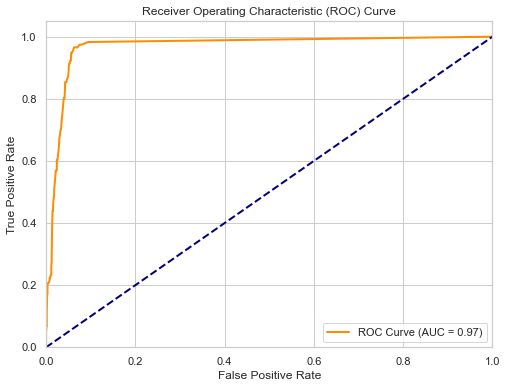

In [19]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'C:/Users/harsha/Desktop/DataMining_733/Project/suggestions.csv'
df = pd.read_csv(file_path)

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Get predicted probabilities for the positive class
y_probs = random_forest.predict_proba(X_test)[:, 1]

# Calculate ROC curve values
fpr, tpr, thresholds = roc_curve(y_test, y_probs)

# Calculate AUC (Area Under the Curve)
roc_auc = roc_auc_score(y_test, y_probs)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [20]:
from prettytable import PrettyTable
# Feature Engineering
df['Votes_Ratio'] = df['Votes_Up'] / (df['Votes_Up'] + df['Votes_Down'])
df['Responses_Per_View'] = df['Responses'] / df['Views']

# Display the updated DataFrame
print(df.head())

   Recommended  Suggestion_Id  Responses  Views  Votes_Up  Votes_Down  \
0            0          35463         77   3849       242           7   
1            0          37480        428  28290      1149         201   
2            0          39814        160   7561       648          45   
3            0          41970         89   9937       197          14   
4            1          47967         12   6977         0           0   

   Author_Id  Author_Join (in terms of how many days since they joined)  \
0       4886                                               1615           
1       3654                                               1617           
2     113401                                               1385           
3       8331                                               1601           
4      13980                                               1593           

   Author_TotalPosts  Author_PostsPerDay  Votes_Ratio  Responses_Per_View  
0               8977              

In [21]:
# Feature Engineering
df['Votes_Ratio'] = df['Votes_Up'] / (df['Votes_Up'] + df['Votes_Down'])
df['Responses_Per_View'] = df['Responses'] / df['Views']
df['Author_Activity_Ratio'] = df['Author_TotalPosts'] / df['Author_Join (in terms of how many days since they joined)']

# Example: Create a binary feature based on the number of Responses
df['High_Responses'] = (df['Responses'] > df['Responses'].mean()).astype(int)

# Example: Create a feature based on the length of the suggestion
df['Suggestion_Length'] = df['Suggestion_Id'].apply(lambda x: len(str(x)))

# Display the updated DataFrame
print(df.head())

   Recommended  Suggestion_Id  Responses  Views  Votes_Up  Votes_Down  \
0            0          35463         77   3849       242           7   
1            0          37480        428  28290      1149         201   
2            0          39814        160   7561       648          45   
3            0          41970         89   9937       197          14   
4            1          47967         12   6977         0           0   

   Author_Id  Author_Join (in terms of how many days since they joined)  \
0       4886                                               1615           
1       3654                                               1617           
2     113401                                               1385           
3       8331                                               1601           
4      13980                                               1593           

   Author_TotalPosts  Author_PostsPerDay  Votes_Ratio  Responses_Per_View  \
0               8977             

In [22]:
#Using the Bagging Algorithm
# Feature Engineering (if not done already)

# Feature Engineering
df['Votes_Ratio'] = df['Votes_Up'] / (df['Votes_Up'] + df['Votes_Down'])
df['Responses_Per_View'] = df['Responses'] / df['Views']
df['Author_Activity_Ratio'] = df['Author_TotalPosts'] / df['Author_Join (in terms of how many days since they joined)']

# Example: Create a binary feature based on the number of Responses
df['High_Responses'] = (df['Responses'] > df['Responses'].mean()).astype(int)

# Example: Create a feature based on the length of the suggestion
df['Suggestion_Length'] = df['Suggestion_Id'].apply(lambda x: len(str(x)))

# Drop rows with missing values
df = df.dropna()

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down', 'Votes_Ratio', 'Responses_Per_View', 'Author_Activity_Ratio', 'Suggestion_Length']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Make predictions on the test data
y_pred_rf = random_forest.predict(X_test)

# Evaluate the Random Forest model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
roc_auc_rf = roc_auc_score(y_test, y_pred_rf)

# Print the evaluation metrics for Random Forest
print("Random Forest Model Performance:")
print(f'Accuracy: {accuracy_rf:.2f}')
print(f'Precision: {precision_rf:.2f}')
print(f'Recall: {recall_rf:.2f}')
print(f'F1-Score: {f1_rf:.2f}')
print(f'ROC AUC: {roc_auc_rf:.2f}')

Random Forest Model Performance:
Accuracy: 0.96
Precision: 0.59
Recall: 0.40
F1-Score: 0.48
ROC AUC: 0.70


In [23]:
from sklearn.ensemble import GradientBoostingClassifier

# Create a Gradient Boosting model
gradient_boost = GradientBoostingClassifier(random_state=42)

# Fit the model on the training data
gradient_boost.fit(X_train, y_train)

# Make predictions on the test data
y_pred_gb = gradient_boost.predict(X_test)

# Evaluate the Gradient Boosting model
accuracy_gb = accuracy_score(y_test, y_pred_gb)
precision_gb = precision_score(y_test, y_pred_gb)
recall_gb = recall_score(y_test, y_pred_gb)
f1_gb = f1_score(y_test, y_pred_gb)
roc_auc_gb = roc_auc_score(y_test, y_pred_gb)

# Print the evaluation metrics for Gradient Boosting
print("\nGradient Boosting Model Performance:")
print(f'Accuracy: {accuracy_gb:.2f}')
print(f'Precision: {precision_gb:.2f}')
print(f'Recall: {recall_gb:.2f}')
print(f'F1-Score: {f1_gb:.2f}')
print(f'ROC AUC: {roc_auc_gb:.2f}')



Gradient Boosting Model Performance:
Accuracy: 0.96
Precision: 0.60
Recall: 0.49
F1-Score: 0.54
ROC AUC: 0.74


In [24]:
from sklearn.ensemble import AdaBoostClassifier
# Create an AdaBoost model with a base estimator (e.g., Decision Tree)
ada_boost = AdaBoostClassifier(random_state=42)

# Fit the model on the training data
ada_boost.fit(X_train, y_train)

# Make predictions on the test data
y_pred_ada = ada_boost.predict(X_test)

# Evaluate the AdaBoost model
accuracy_ada = accuracy_score(y_test, y_pred_ada)
precision_ada = precision_score(y_test, y_pred_ada)
recall_ada = recall_score(y_test, y_pred_ada)
f1_ada = f1_score(y_test, y_pred_ada)
roc_auc_ada = roc_auc_score(y_test, y_pred_ada)

# Print the evaluation metrics for AdaBoost
print("AdaBoost Model Performance:")
print(f'Accuracy: {accuracy_ada:.2f}')
print(f'Precision: {precision_ada:.2f}')
print(f'Recall: {recall_ada:.2f}')
print(f'F1-Score: {f1_ada:.2f}')
print(f'ROC AUC: {roc_auc_ada:.2f}')

AdaBoost Model Performance:
Accuracy: 0.96
Precision: 0.49
Recall: 0.40
F1-Score: 0.44
ROC AUC: 0.69


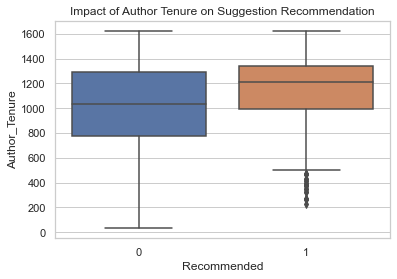

T-test: t_stat = 9.311123758307525, p_value = 1.4658408782799512e-20
               Author_Tenure  Responses     Views  Votes_Up  Votes_Down  \
Author_Tenure       1.000000   0.144211  0.083375  0.132743    0.088542   
Responses           0.144211   1.000000  0.722624  0.880215    0.674251   
Views               0.083375   0.722624  1.000000  0.716127    0.559684   
Votes_Up            0.132743   0.880215  0.716127  1.000000    0.631198   
Votes_Down          0.088542   0.674251  0.559684  0.631198    1.000000   
Recommended         0.081462   0.325719  0.291544  0.333363    0.076376   

               Recommended  
Author_Tenure     0.081462  
Responses         0.325719  
Views             0.291544  
Votes_Up          0.333363  
Votes_Down        0.076376  
Recommended       1.000000  


In [27]:
#task-2
from scipy.stats import ttest_ind
# Feature Engineering
df['Author_Tenure'] = df['Author_Join (in terms of how many days since they joined)']

# Explore the relationship between Author_Tenure and Recommended
sns.boxplot(x='Recommended', y='Author_Tenure', data=df)
plt.title('Impact of Author Tenure on Suggestion Recommendation')
plt.show()

# Perform a t-test
recommended_tenure = df[df['Recommended'] == 1]['Author_Tenure']
not_recommended_tenure = df[df['Recommended'] == 0]['Author_Tenure']

t_stat, p_value = ttest_ind(recommended_tenure, not_recommended_tenure)
print(f'T-test: t_stat = {t_stat}, p_value = {p_value}')

# Correlation Analysis
correlation_matrix = df[['Author_Tenure', 'Responses', 'Views', 'Votes_Up', 'Votes_Down', 'Recommended']].corr()
print(correlation_matrix)

In [30]:
#task-3
# Feature Engineering
df['Votes_Ratio'] = df['Votes_Up'] / (df['Votes_Up'] + df['Votes_Down'])
df['Responses_Per_View'] = df['Responses'] / df['Views']
df['Author_Activity_Ratio'] = df['Author_TotalPosts'] / df['Author_Join (in terms of how many days since they joined)']

# Create a binary feature based on the number of Responses
df['High_Responses'] = (df['Responses'] > df['Responses'].mean()).astype(int)

# Create a feature based on the length of the suggestion
df['Suggestion_Length'] = df['Suggestion_Id'].apply(lambda x: len(str(x)))

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down', 'Votes_Ratio', 'Responses_Per_View', 'Author_Activity_Ratio', 'Suggestion_Length']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Make predictions on the test data
y_pred_rf = random_forest.predict(X_test)

# Evaluate the Random Forest model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
roc_auc_rf = roc_auc_score(y_test, y_pred_rf)

# Print the evaluation metrics for Random Forest
print("Random Forest Model Performance:")
print(f'Accuracy: {accuracy_rf:.2f}')
print(f'Precision: {precision_rf:.2f}')
print(f'Recall: {recall_rf:.2f}')
print(f'F1-Score: {f1_rf:.2f}')
print(f'ROC AUC: {roc_auc_rf:.2f}')

# Rank employees based on predicted probability of making a good suggestion
df['Prediction_Probability'] = random_forest.predict_proba(X)[:, 1]
employee_ranking = df[['Author_Id', 'Prediction_Probability']].groupby('Author_Id').mean().sort_values(by='Prediction_Probability', ascending=False)
print("Employee Ranking based on Prediction Probability:")
print(employee_ranking)

# Identify groups of employees for more reliable suggestions
# You can use clustering techniques or group employees based on certain criteria
# For example, group by department or years of experience
employee_groups = df.groupby('Department')['Prediction_Probability'].mean().sort_values(ascending=False)
print("Employee Groups based on Department:")
print(employee_groups)

Random Forest Model Performance:
Accuracy: 0.96
Precision: 0.59
Recall: 0.40
F1-Score: 0.48
ROC AUC: 0.70
Employee Ranking based on Prediction Probability:
           Prediction_Probability
Author_Id                        
191483                       0.90
310661                       0.88
885075                       0.88
294532                       0.86
647117                       0.85
...                           ...
419329                       0.00
419376                       0.00
419482                       0.00
419541                       0.00
1494488                      0.00

[3773 rows x 1 columns]


KeyError: 'Department'

In [31]:
# Feature Engineering
df['Votes_Ratio'] = df['Votes_Up'] / (df['Votes_Up'] + df['Votes_Down'])
df['Responses_Per_View'] = df['Responses'] / df['Views']
df['Author_Activity_Ratio'] = df['Author_TotalPosts'] / df['Author_Join (in terms of how many days since they joined)']

# Example: Create a binary feature based on the number of Responses
df['High_Responses'] = (df['Responses'] > df['Responses'].mean()).astype(int)

# Example: Create a feature based on the length of the suggestion
df['Suggestion_Length'] = df['Suggestion_Id'].apply(lambda x: len(str(x)))

# Drop rows with missing values
df = df.dropna()

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down', 'Votes_Ratio', 'Responses_Per_View', 'Author_Activity_Ratio', 'Suggestion_Length']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Rank employees based on predicted probability of making a good suggestion
df['Prediction_Probability'] = random_forest.predict_proba(X)[:, 1]
employee_ranking = df.groupby('Author_Id')['Prediction_Probability'].mean().sort_values(ascending=False)
print("Employee Ranking based on Prediction Probability:")
print(employee_ranking)

# You can use clustering techniques or group employees based on certain criteria
# For example, group by department or years of experience
employee_groups = df.groupby('Author_Department')['Prediction_Probability'].mean().sort_values(ascending=False)
print("Employee Groups based on Department:")
print(employee_groups)

Employee Ranking based on Prediction Probability:
Author_Id
191483     0.90
310661     0.88
885075     0.88
294532     0.86
647117     0.85
           ... 
419329     0.00
419376     0.00
419482     0.00
419541     0.00
1494488    0.00
Name: Prediction_Probability, Length: 3773, dtype: float64


KeyError: 'Author_Department'

In [32]:
# Assuming 'Author_Join (in terms of how many days since they joined)' is the column representing the duration of employment
df['Votes_Ratio'] = df['Votes_Up'] / (df['Votes_Up'] + df['Votes_Down'])
df['Responses_Per_View'] = df['Responses'] / df['Views']
df['Author_Activity_Ratio'] = df['Author_TotalPosts'] / df['Author_Join (in terms of how many days since they joined)']
df['High_Responses'] = (df['Responses'] > df['Responses'].mean()).astype(int)
df['Suggestion_Length'] = df['Suggestion_Id'].apply(lambda x: len(str(x)))

# Drop rows with missing values
df = df.dropna()

# Define features and target variable
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down', 'Votes_Ratio', 'Responses_Per_View', 'Author_Activity_Ratio', 'Suggestion_Length']]
y = df['Recommended']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)
random_forest.fit(X_train, y_train)

# Rank employees based on predicted probability of making a good suggestion
df['Prediction_Probability'] = random_forest.predict_proba(X)[:, 1]
employee_ranking = df.groupby('Author_Join (in terms of how many days since they joined)')['Prediction_Probability'].mean().sort_values(ascending=False)
print("Employee Ranking based on Prediction Probability:")
print(employee_ranking)

Employee Ranking based on Prediction Probability:
Author_Join (in terms of how many days since they joined)
231     0.800000
846     0.440000
1289    0.430000
1538    0.410000
1237    0.398621
          ...   
698     0.000000
702     0.000000
703     0.000000
704     0.000000
1624    0.000000
Name: Prediction_Probability, Length: 1177, dtype: float64
